In [1]:
import numpy as np #mathematical calculations
import pandas as pd # cleaning exploring and manupulation of data
import matplotlib.pyplot as plt # it is used for data visualisation which is a ML lib
import seaborn as sns #data viz library used to show attractive statistical graphs
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score


In [2]:
df=pd.read_csv('BigBasket Products.csv')

In [3]:
df

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
0,1,Garlic Oil - Vegetarian Capsule 500 mg,Beauty & Hygiene,Hair Care,Sri Sri Ayurveda,220.00,220.0,Hair Oil & Serum,4.1,This Product contains Garlic Oil that is known...
1,2,Water Bottle - Orange,"Kitchen, Garden & Pets",Storage & Accessories,Mastercook,180.00,180.0,Water & Fridge Bottles,2.3,"Each product is microwave safe (without lid), ..."
2,3,"Brass Angle Deep - Plain, No.2",Cleaning & Household,Pooja Needs,Trm,119.00,250.0,Lamp & Lamp Oil,3.4,"A perfect gift for all occasions, be it your m..."
3,4,Cereal Flip Lid Container/Storage Jar - Assort...,Cleaning & Household,Bins & Bathroom Ware,Nakoda,149.00,176.0,"Laundry, Storage Baskets",3.7,Multipurpose container with an attractive desi...
4,5,Creme Soft Soap - For Hands & Body,Beauty & Hygiene,Bath & Hand Wash,Nivea,162.00,162.0,Bathing Bars & Soaps,4.4,Nivea Creme Soft Soap gives your skin the best...
...,...,...,...,...,...,...,...,...,...,...
27550,27551,"Wottagirl! Perfume Spray - Heaven, Classic",Beauty & Hygiene,Fragrances & Deos,Layerr,199.20,249.0,Perfume,3.9,Layerr brings you Wottagirl Classic fragrant b...
27551,27552,Rosemary,Gourmet & World Food,Cooking & Baking Needs,Puramate,67.50,75.0,"Herbs, Seasonings & Rubs",4.0,Puramate rosemary is enough to transform a dis...
27552,27553,Peri-Peri Sweet Potato Chips,Gourmet & World Food,"Snacks, Dry Fruits, Nuts",FabBox,200.00,200.0,Nachos & Chips,3.8,We have taken the richness of Sweet Potatoes (...
27553,27554,Green Tea - Pure Original,Beverages,Tea,Tetley,396.00,495.0,Tea Bags,4.2,"Tetley Green Tea with its refreshing pure, ori..."


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27555 entries, 0 to 27554
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   index         27555 non-null  int64  
 1   product       27554 non-null  object 
 2   category      27555 non-null  object 
 3   sub_category  27555 non-null  object 
 4   brand         27554 non-null  object 
 5   sale_price    27555 non-null  float64
 6   market_price  27555 non-null  float64
 7   type          27555 non-null  object 
 8   rating        18929 non-null  float64
 9   description   27440 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 2.1+ MB


In [5]:
df.isnull().sum()

index              0
product            1
category           0
sub_category       0
brand              1
sale_price         0
market_price       0
type               0
rating          8626
description      115
dtype: int64

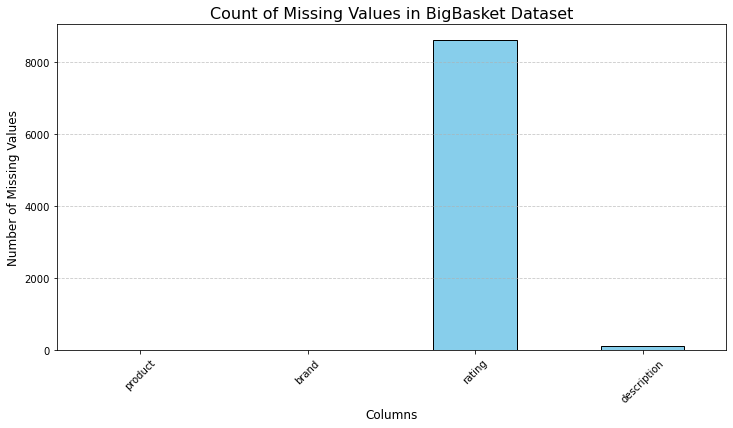

In [6]:
# Count of missing values per column
null_counts = df.isnull().sum()

# Filter only columns with null values
null_counts = null_counts[null_counts > 0]

# Check if null_counts is empty
if not null_counts.empty:
    # Plot the bar chart
    plt.figure(figsize=(12, 6))
    null_counts.plot(kind='bar', color='skyblue', edgecolor='black')
    plt.title('Count of Missing Values in BigBasket Dataset', fontsize=16)
    plt.xlabel('Columns', fontsize=12)
    plt.ylabel('Number of Missing Values', fontsize=12)
    plt.xticks(rotation=45)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()
else:
    print("No missing values found in the dataset.")

From the visualisation we can say that only product, brand, rating and description c0lumns have null values

In [7]:
df[(df['product'].isnull())] 


,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
14363,14364,NaN,Beverages,Coffee,Cothas Coffee,200.0,240.0,Ground Coffee,4.2,Cothas Specialty Blend Coffee and Chicory incl...


In [8]:
df = df[~(df['product'].isnull())] 

In [9]:
df[(df['product'].isnull())] 

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description


In [10]:
df[(df['brand'].isnull())] 


,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
9765,9766,Food Package - Medium,Cleaning & Household,"Disposables, Garbage Bag",NaN,50.0,50.0,"Aluminium Foil, Clingwrap",NaN,NaN


In [11]:
df = df[~(df['brand'].isnull())] 


In [12]:
df[(df['brand'].isnull())] 


,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description


In [13]:
# percentage of null values

df.isnull().sum()*100/len(df)

index            0.000000
product          0.000000
category         0.000000
sub_category     0.000000
brand            0.000000
sale_price       0.000000
market_price     0.000000
type             0.000000
rating          31.303306
description      0.413748
dtype: float64

In [14]:
df[df[['rating', 'description',]].isnull().all(axis=1)]

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
1542,1543,Salsa Tortilla - Dip Chunky Hot,Gourmet & World Food,"Sauces, Spreads & Dips",Cantina Mexicana,225.00,225.00,"Hummus, Cheese, Salsa Dip",NaN,NaN
1815,1816,Chai / Coffee/ Tea-Milk Mug - Women Print,"Kitchen, Garden & Pets",Crockery & Cutlery,Rslee,299.00,299.00,"Cups, Mugs & Tumblers",NaN,NaN
4250,4251,Tuna Spread In Mayonnaise,"Eggs, Meat & Fish",Fish & Seafood,Golden Prize,185.25,195.00,Canned Seafood,NaN,NaN
4647,4648,Bathing Soap - Ayurvedic Natural Glycerine,Beauty & Hygiene,Bath & Hand Wash,Medimix,30.00,30.00,Bathing Bars & Soaps,NaN,NaN
6322,6323,Mist - Rose,Beauty & Hygiene,Skin Care,moha,144.00,180.00,Face Care,NaN,NaN
9104,9105,Microwave Popcorn - Butter,Gourmet & World Food,"Snacks, Dry Fruits, Nuts",American Garden,240.00,240.00,Gourmet Popcorn,NaN,NaN
10491,10492,Beans - Julienne,Fruits & Vegetables,Fresh Vegetables,Fresho,43.00,53.75,Cut & Peeled Veggies,NaN,NaN
12898,12899,Basil Seed Drinks - Pomegranate,Gourmet & World Food,Drinks & Beverages,Americano,90.00,90.00,Gourmet Juices & Drinks,NaN,NaN
14474,14475,Beard & Face Grooming Oil,Beauty & Hygiene,Men's Grooming,Aloe Veda,495.00,550.00,Moustache & Beard Care,NaN,NaN
14589,14590,Cheese Dip for Tortilla Chips Cheddar,Gourmet & World Food,"Sauces, Spreads & Dips",Cantina Mexicana,225.00,225.00,"Hummus, Cheese, Salsa Dip",NaN,NaN


In [15]:
df = df[~df[['rating', 'description',]].isnull().all(axis=1)]

In [16]:
df[df[['rating', 'description',]].isnull().all(axis=1)]

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description


In [17]:
# percentage of null values

df.isnull().sum()*100/len(df)

index            0.000000
product          0.000000
category         0.000000
sub_category     0.000000
brand            0.000000
sale_price       0.000000
market_price     0.000000
type             0.000000
rating          31.238420
description      0.319686
dtype: float64

In [18]:
df[(df['description'].isnull())] 


,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
288,289,Arrabbiata Tomato Pasta Sauce With Chilli,Gourmet & World Food,"Sauces, Spreads & Dips",Montanini,325.00,325.0,Mustard & Cheese Sauces,5.0,NaN
480,481,"Pumice Stone & Emery Foot Filer - FFL3407, Col...",Beauty & Hygiene,Bath & Hand Wash,Kaiv,175.00,175.0,Bathing Accessories,3.8,NaN
780,781,Peanut Butter - Chunky,Gourmet & World Food,"Sauces, Spreads & Dips",American Garden,299.00,299.0,"Chocolate, Peanut Spread",4.1,NaN
845,846,Squash - Sarasaparilla/Nannari/Sugandhi Root,Beverages,Fruit Juices & Drinks,NaturoBell,140.00,140.0,Syrups & Concentrates,2.5,NaN
1047,1048,"Natura Rice & Walnut Drink, Vegan",Gourmet & World Food,Drinks & Beverages,BORGES,275.01,349.0,Health Drinks,4.5,NaN
...,...,...,...,...,...,...,...,...,...,...
25480,25481,Whole Wheat Pasta - Penne Rigate,Gourmet & World Food,"Pasta, Soup & Noodles",BORGES,137.50,275.0,Pastas & Spaghetti,4.0,NaN
25583,25584,Chai/Chai/Tea/ Coffee Bone China Microwave Ser...,"Kitchen, Garden & Pets",Crockery & Cutlery,BP Bharat,269.00,373.0,"Cups, Mugs & Tumblers",2.5,NaN
26116,26117,"Tea Strainer - Stainless Steel, Medium","Kitchen, Garden & Pets",Kitchen Accessories,Ritu,99.00,135.0,"Strainer, Ladle, Spatula",4.3,NaN
26835,26836,Cold Pressed Virgin Groundnut Oil,"Foodgrains, Oil & Masala",Edible Oils & Ghee,Chekko,325.00,325.0,Groundnut Oil,4.2,NaN


In [19]:
df = df[~(df['description'].isnull())] 


In [20]:
df[(df['description'].isnull())] 


,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description


In [21]:
# percentage of null values

df.isnull().sum()*100/len(df)

index            0.000000
product          0.000000
category         0.000000
sub_category     0.000000
brand            0.000000
sale_price       0.000000
market_price     0.000000
type             0.000000
rating          31.338606
description      0.000000
dtype: float64

In [22]:
df[(df['rating'].isnull())] 


,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description
55,56,Soothing Cucumber Facial Scrub With Apricot Seeds,Beauty & Hygiene,Skin Care,TJORI,299.4,499.0,Face Care,NaN,The soothing feel of cucumber meets the gentle...
59,60,Corporate Planner Diary With Premium PU Leathe...,Cleaning & Household,Stationery,Prozo Plus,399.0,399.0,"Notebooks, Files, Folders",NaN,A5 Size (210x150mm) \n192 Pages Premium Natura...
65,66,Ayurvedic Anti-Tan Face Pack,Beauty & Hygiene,Skin Care,TJORI,269.4,449.0,Face Care,NaN,A nourishing face pack that removes tan and br...
68,69,Organic Carom Seeds/Ajwain/Om Kalu,"Foodgrains, Oil & Masala",Masalas & Spices,Earthon,72.0,72.0,Whole Spices,NaN,"Earthon's Ajwain is Best quality, organically ..."
69,70,"Padded Harness - 3/4 inch, Grey Colour","Kitchen, Garden & Pets",Pet Food & Accessories,Glenand,840.0,840.0,Pet Collars & Leashes,NaN,These are soft padded harness for your active ...
...,...,...,...,...,...,...,...,...,...,...
27509,27510,Deluxe Crackers - Veg,Gourmet & World Food,Chocolates & Biscuits,Kerk,150.0,150.0,"Cookies, Biscotti, Wafer",NaN,Kerk Biscuits-has been a household name synony...
27511,27512,Specialist Stain Remover Pen & Marker,Cleaning & Household,All Purpose Cleaners,365,449.0,449.0,Imported Cleaners,NaN,Mightier than the pen. The pen may be mightier...
27514,27515,Verge & Sheer Perfume For Pair,Beauty & Hygiene,Fragrances & Deos,Skinn by Titan,1615.5,1795.0,Perfume,NaN,VERGE for men paints a picture of a classy out...
27530,27531,Tick'et to Fleadom Dry Shampoo For Dogs,"Kitchen, Garden & Pets",Pet Food & Accessories,Captain Zack,99.0,99.0,Pet Cleaning & Grooming,NaN,1) No Rinse Defence Against Ticks and Fleas: C...


In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27439 entries, 0 to 27554
Data columns (total 10 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   index         27439 non-null  int64  
 1   product       27439 non-null  object 
 2   category      27439 non-null  object 
 3   sub_category  27439 non-null  object 
 4   brand         27439 non-null  object 
 5   sale_price    27439 non-null  float64
 6   market_price  27439 non-null  float64
 7   type          27439 non-null  object 
 8   rating        18840 non-null  float64
 9   description   27439 non-null  object 
dtypes: float64(3), int64(1), object(6)
memory usage: 2.3+ MB


In [24]:
df.rating.skew()

-1.7313717623553035

In [25]:
df.rating.fillna(df.rating.mean(), inplace=True)
df.isnull().sum()

index           0
product         0
category        0
sub_category    0
brand           0
sale_price      0
market_price    0
type            0
rating          0
description     0
dtype: int64

In [26]:
df.describe()

,index,sale_price,market_price,rating
count,27439.000000,27439.000000,27439.000000,27439.000000
mean,13778.836255,322.701129,382.238589,3.943063
std,7955.582541,486.857214,581.866963,0.612882
min,1.000000,2.450000,3.000000,1.000000
25%,6888.500000,95.000000,100.000000,3.943063
50%,13781.000000,190.000000,220.000000,3.943063
75%,20667.500000,359.000000,425.000000,4.200000
max,27555.000000,12500.000000,12500.000000,5.000000


# Creation of a new feature "Price difference" 

In [27]:
df['diff_in_prices'] = df['market_price'] - df['sale_price']


In [28]:
df

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description,diff_in_prices
0,1,Garlic Oil - Vegetarian Capsule 500 mg,Beauty & Hygiene,Hair Care,Sri Sri Ayurveda,220.00,220.0,Hair Oil & Serum,4.1,This Product contains Garlic Oil that is known...,0.00
1,2,Water Bottle - Orange,"Kitchen, Garden & Pets",Storage & Accessories,Mastercook,180.00,180.0,Water & Fridge Bottles,2.3,"Each product is microwave safe (without lid), ...",0.00
2,3,"Brass Angle Deep - Plain, No.2",Cleaning & Household,Pooja Needs,Trm,119.00,250.0,Lamp & Lamp Oil,3.4,"A perfect gift for all occasions, be it your m...",131.00
3,4,Cereal Flip Lid Container/Storage Jar - Assort...,Cleaning & Household,Bins & Bathroom Ware,Nakoda,149.00,176.0,"Laundry, Storage Baskets",3.7,Multipurpose container with an attractive desi...,27.00
4,5,Creme Soft Soap - For Hands & Body,Beauty & Hygiene,Bath & Hand Wash,Nivea,162.00,162.0,Bathing Bars & Soaps,4.4,Nivea Creme Soft Soap gives your skin the best...,0.00
...,...,...,...,...,...,...,...,...,...,...,...
27550,27551,"Wottagirl! Perfume Spray - Heaven, Classic",Beauty & Hygiene,Fragrances & Deos,Layerr,199.20,249.0,Perfume,3.9,Layerr brings you Wottagirl Classic fragrant b...,49.80
27551,27552,Rosemary,Gourmet & World Food,Cooking & Baking Needs,Puramate,67.50,75.0,"Herbs, Seasonings & Rubs",4.0,Puramate rosemary is enough to transform a dis...,7.50
27552,27553,Peri-Peri Sweet Potato Chips,Gourmet & World Food,"Snacks, Dry Fruits, Nuts",FabBox,200.00,200.0,Nachos & Chips,3.8,We have taken the richness of Sweet Potatoes (...,0.00
27553,27554,Green Tea - Pure Original,Beverages,Tea,Tetley,396.00,495.0,Tea Bags,4.2,"Tetley Green Tea with its refreshing pure, ori...",99.00


# Creation of a new feature "Discount Percentage"

In [29]:
df['discount_percentage'] = (df['diff_in_prices'] / df['market_price']) * 100


In [30]:
df

,index,product,category,sub_category,brand,sale_price,market_price,type,rating,description,diff_in_prices,discount_percentage
0,1,Garlic Oil - Vegetarian Capsule 500 mg,Beauty & Hygiene,Hair Care,Sri Sri Ayurveda,220.00,220.0,Hair Oil & Serum,4.1,This Product contains Garlic Oil that is known...,0.00,0.000000
1,2,Water Bottle - Orange,"Kitchen, Garden & Pets",Storage & Accessories,Mastercook,180.00,180.0,Water & Fridge Bottles,2.3,"Each product is microwave safe (without lid), ...",0.00,0.000000
2,3,"Brass Angle Deep - Plain, No.2",Cleaning & Household,Pooja Needs,Trm,119.00,250.0,Lamp & Lamp Oil,3.4,"A perfect gift for all occasions, be it your m...",131.00,52.400000
3,4,Cereal Flip Lid Container/Storage Jar - Assort...,Cleaning & Household,Bins & Bathroom Ware,Nakoda,149.00,176.0,"Laundry, Storage Baskets",3.7,Multipurpose container with an attractive desi...,27.00,15.340909
4,5,Creme Soft Soap - For Hands & Body,Beauty & Hygiene,Bath & Hand Wash,Nivea,162.00,162.0,Bathing Bars & Soaps,4.4,Nivea Creme Soft Soap gives your skin the best...,0.00,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
27550,27551,"Wottagirl! Perfume Spray - Heaven, Classic",Beauty & Hygiene,Fragrances & Deos,Layerr,199.20,249.0,Perfume,3.9,Layerr brings you Wottagirl Classic fragrant b...,49.80,20.000000
27551,27552,Rosemary,Gourmet & World Food,Cooking & Baking Needs,Puramate,67.50,75.0,"Herbs, Seasonings & Rubs",4.0,Puramate rosemary is enough to transform a dis...,7.50,10.000000
27552,27553,Peri-Peri Sweet Potato Chips,Gourmet & World Food,"Snacks, Dry Fruits, Nuts",FabBox,200.00,200.0,Nachos & Chips,3.8,We have taken the richness of Sweet Potatoes (...,0.00,0.000000
27553,27554,Green Tea - Pure Original,Beverages,Tea,Tetley,396.00,495.0,Tea Bags,4.2,"Tetley Green Tea with its refreshing pure, ori...",99.00,20.000000


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 27439 entries, 0 to 27554
Data columns (total 12 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   index                27439 non-null  int64  
 1   product              27439 non-null  object 
 2   category             27439 non-null  object 
 3   sub_category         27439 non-null  object 
 4   brand                27439 non-null  object 
 5   sale_price           27439 non-null  float64
 6   market_price         27439 non-null  float64
 7   type                 27439 non-null  object 
 8   rating               27439 non-null  float64
 9   description          27439 non-null  object 
 10  diff_in_prices       27439 non-null  float64
 11  discount_percentage  27439 non-null  float64
dtypes: float64(5), int64(1), object(6)
memory usage: 2.7+ MB


# Outliers Detection

In [32]:
df.describe()

,index,sale_price,market_price,rating,diff_in_prices,discount_percentage
count,27439.000000,27439.000000,27439.000000,27439.000000,27439.00000,27439.000000
mean,13778.836255,322.701129,382.238589,3.943063,59.53746,11.833443
std,7955.582541,486.857214,581.866963,0.612882,169.14659,14.624785
min,1.000000,2.450000,3.000000,1.000000,0.00000,0.000000
25%,6888.500000,95.000000,100.000000,3.943063,0.00000,0.000000
50%,13781.000000,190.000000,220.000000,3.943063,6.00000,5.000000
75%,20667.500000,359.000000,425.000000,4.200000,51.00000,20.000000
max,27555.000000,12500.000000,12500.000000,5.000000,4320.00000,83.666667


In [33]:
df['sale_price'].quantile(0.95)

999.0

In [34]:
df['sale_price'].quantile(0.99)

2399.619999999999

# Boxploting All the Numerical features to see outliers

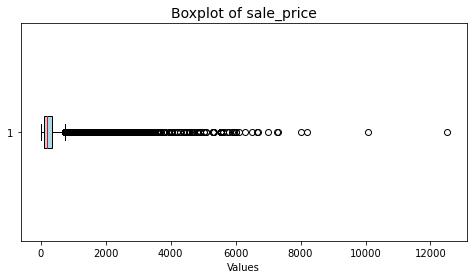

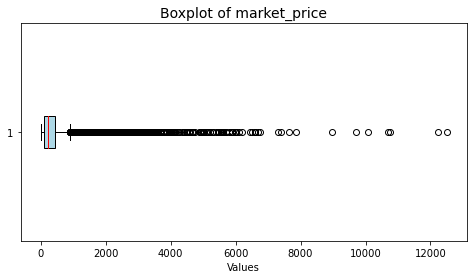

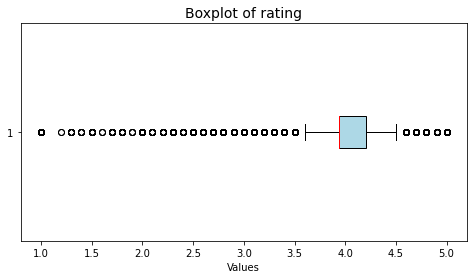

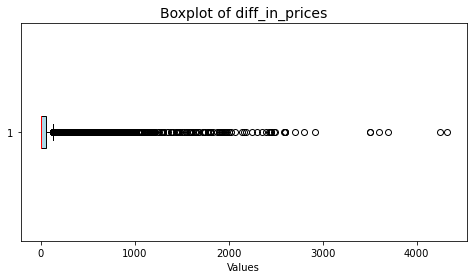

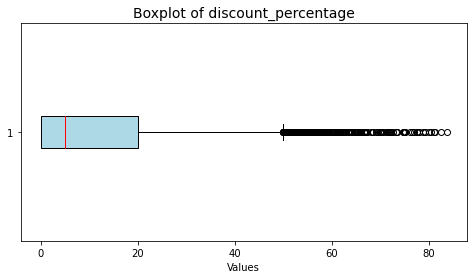

In [35]:
# List of numerical columns
numerical_columns = ['sale_price', 'market_price', 'rating', 'diff_in_prices', 'discount_percentage']

# Plot boxplots for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(8, 4))
    plt.boxplot(df[column].dropna(), vert=False, patch_artist=True,
                boxprops=dict(facecolor='lightblue', color='black'),
                medianprops=dict(color='red'))
    plt.title(f'Boxplot of {column}', fontsize=14)
    plt.xlabel('Values')
    plt.show()


Even though there are outliers, it is not necessary to impute or remove them

# Univariate Analysis 

In [36]:

numerical_columns = df.select_dtypes(include=['float64', 'int64']).columns

print("Numerical Columns:")
print(numerical_columns)


Numerical Columns:
Index(['index', 'sale_price', 'market_price', 'rating', 'diff_in_prices',
       'discount_percentage'],
      dtype='object')


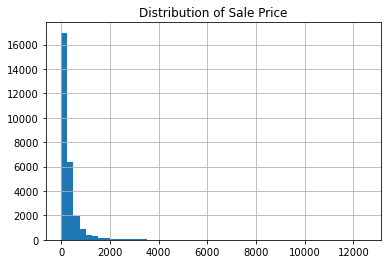

In [37]:
df['sale_price'].hist(bins=50)
plt.title('Distribution of Sale Price')
plt.show()

In [38]:
df['category'].value_counts()


Beauty & Hygiene            7856
Gourmet & World Food        4647
Kitchen, Garden & Pets      3562
Snacks & Branded Foods      2813
Cleaning & Household        2665
Foodgrains, Oil & Masala    2655
Beverages                    881
Bakery, Cakes & Dairy        851
Baby Care                    609
Fruits & Vegetables          556
Eggs, Meat & Fish            344
Name: category, dtype: int64

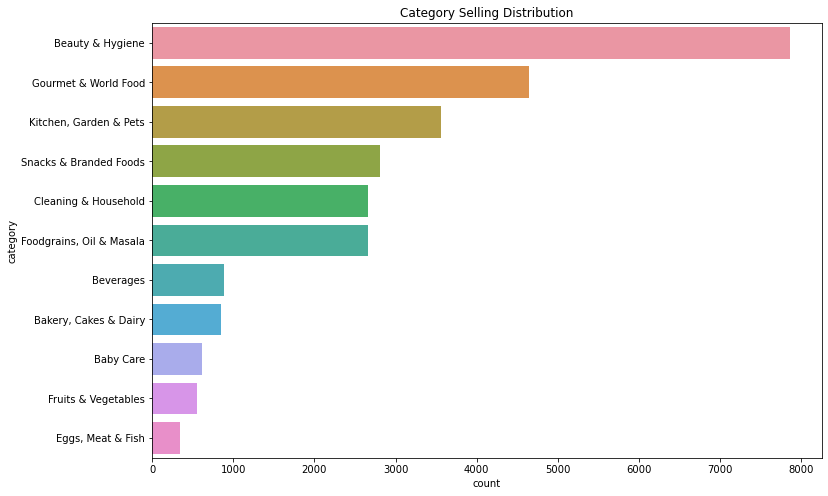

In [39]:
# Countplot for Category
plt.figure(figsize=(12, 8))
sns.countplot(y=df['category'], order=df['category'].value_counts().index)
plt.title('Category Selling Distribution')
plt.show()

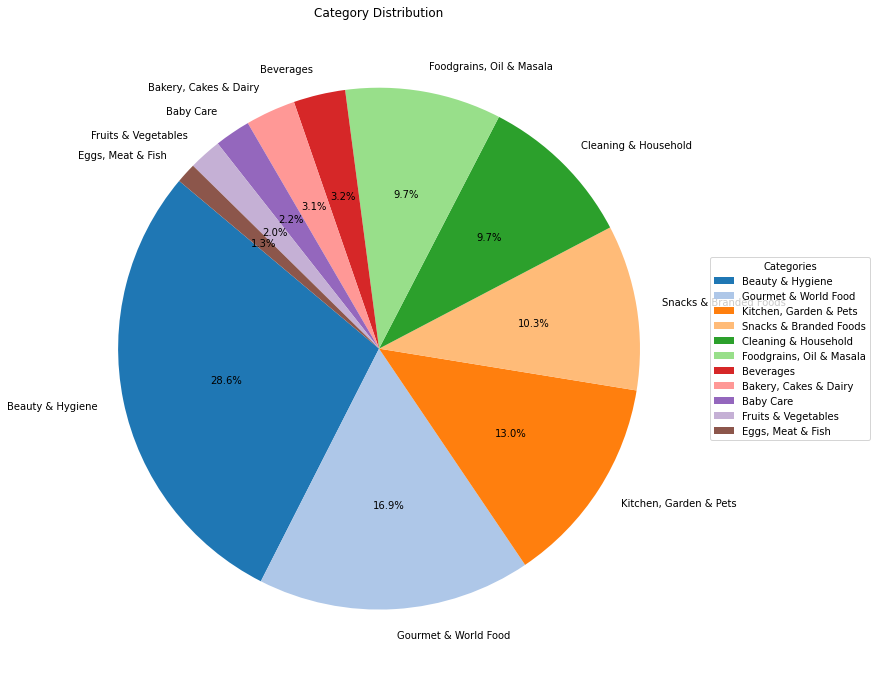

In [40]:
# Calculate category frequencies
category_frequencies = df['category'].value_counts()

# Create a pie chart
plt.figure(figsize=(12, 12))

# Pie chart
plt.pie(category_frequencies, labels=category_frequencies.index, autopct='%1.1f%%', startangle=140, colors=plt.cm.tab20.colors)

# Add a legend on the right side
plt.legend(category_frequencies.index, title='Categories', loc='center left', bbox_to_anchor=(1, 0.5))

# Title
plt.title('Category Distribution')

# Show the plot
plt.show()

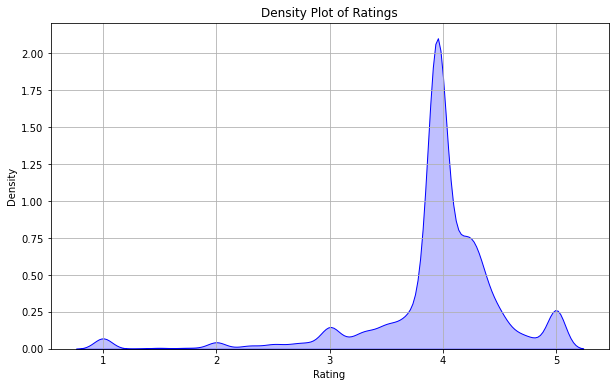

In [41]:
# Create a density plot
plt.figure(figsize=(10, 6))
sns.kdeplot(df['rating'], shade=True, color='blue')
plt.title('Density Plot of Ratings')
plt.xlabel('Rating')
plt.ylabel('Density')
plt.grid(True)
plt.show()

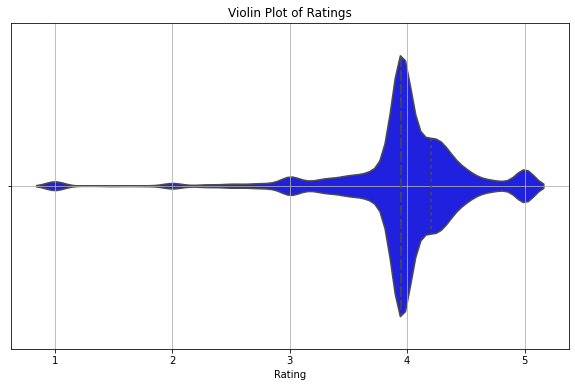

In [42]:
# Create a violin plot
plt.figure(figsize=(10, 6))
sns.violinplot(x='rating', data=df, inner='quartile', color='blue')
plt.title('Violin Plot of Ratings')
plt.xlabel('Rating')
plt.grid(True)
plt.show()

# Bivariate Analysis

Bivariate analysis helps you understand the relationship between two variables.
there are four types of bivariate analysis


1.Numerical to Numerical 
2.Categorical to Categorical 
3.Numerical to Categrical 
4.Categorical to Numerical

In Numerical to Numerical, Firstly we will see the relationship between Sale price and Market Price

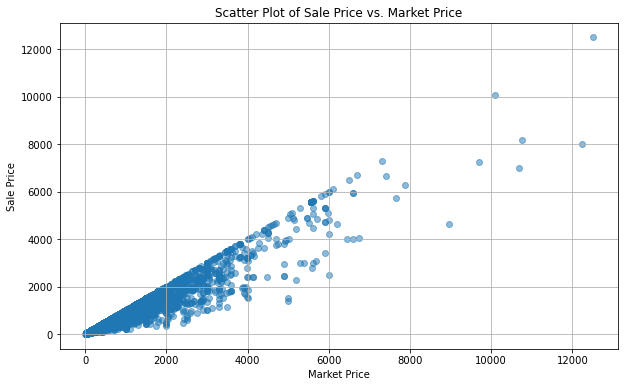

In [43]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['market_price'], df['sale_price'], alpha=0.5)
plt.title('Scatter Plot of Sale Price vs. Market Price')
plt.xlabel('Market Price')
plt.ylabel('Sale Price')
plt.grid(True)
plt.show()

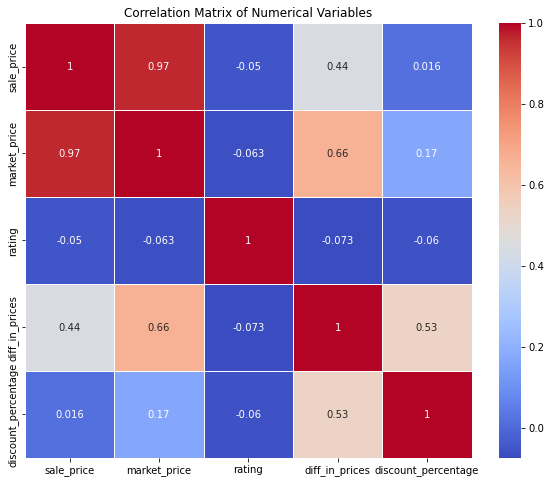

In [44]:
# Select numerical columns
numerical_columns = ['sale_price', 'market_price', 'rating', 'diff_in_prices', 'discount_percentage']

# Create a correlation matrix
correlation_matrix = df[numerical_columns].corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=0.5)
plt.title('Correlation Matrix of Numerical Variables')
plt.show()

This Correlation matrix helps us to understand the correlation between numerical variables.

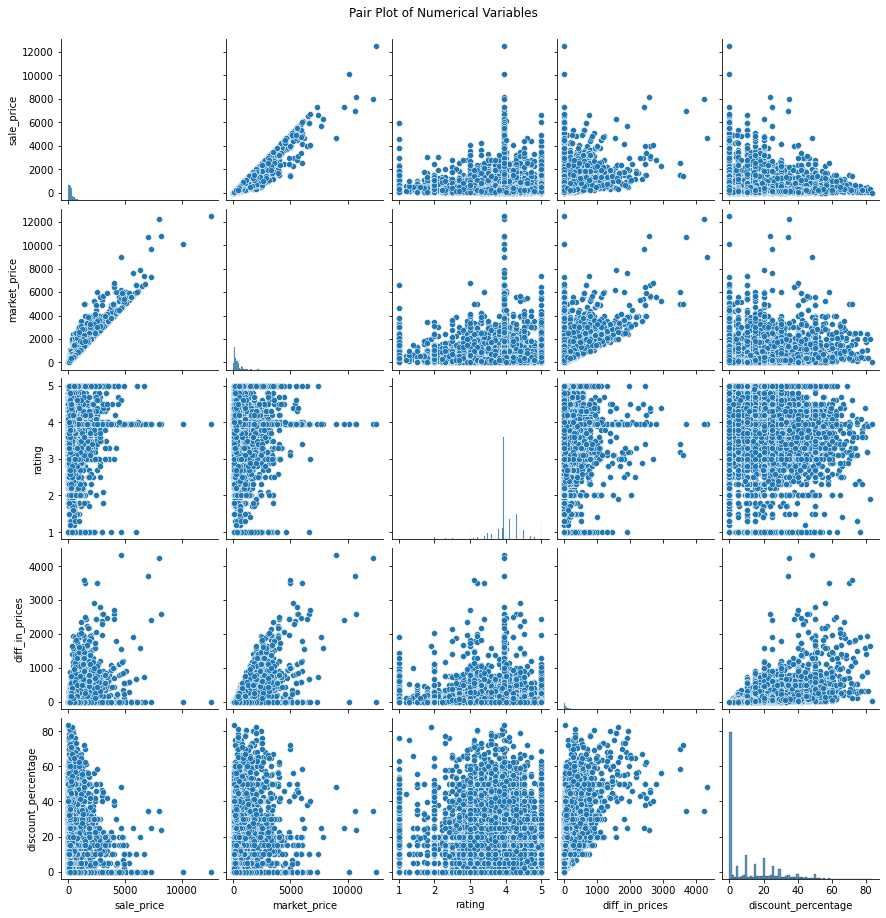

In [45]:

# Select numerical columns
numerical_columns = ['sale_price', 'market_price', 'rating', 'diff_in_prices', 'discount_percentage']

# Create a pair plot
sns.pairplot(df[numerical_columns])
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()

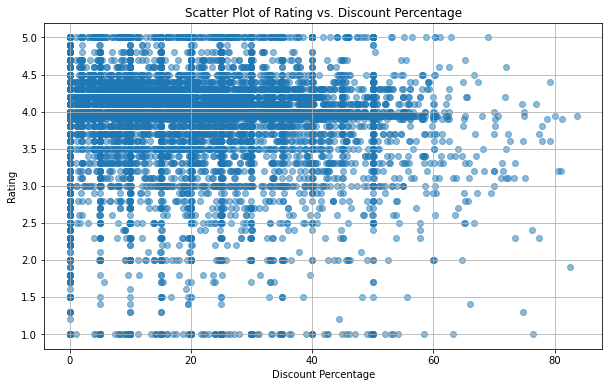

In [46]:
# Create a scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(df['discount_percentage'], df['rating'], alpha=0.5)
plt.title('Scatter Plot of Rating vs. Discount Percentage')
plt.xlabel('Discount Percentage')
plt.ylabel('Rating')
plt.grid(True)
plt.show()

# Numerical to Categorical

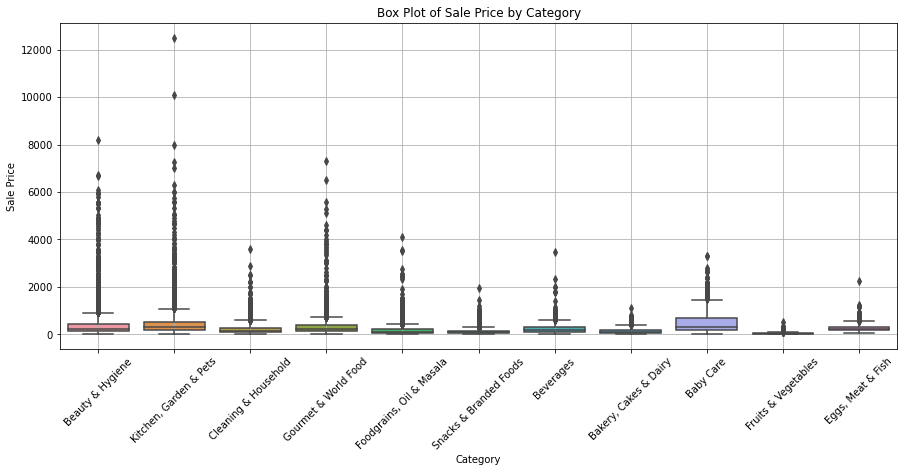

In [47]:
# Create a box plot
plt.figure(figsize=(15, 6))
sns.boxplot(x='category', y='sale_price', data=df)
plt.title('Box Plot of Sale Price by Category')
plt.xlabel('Category')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

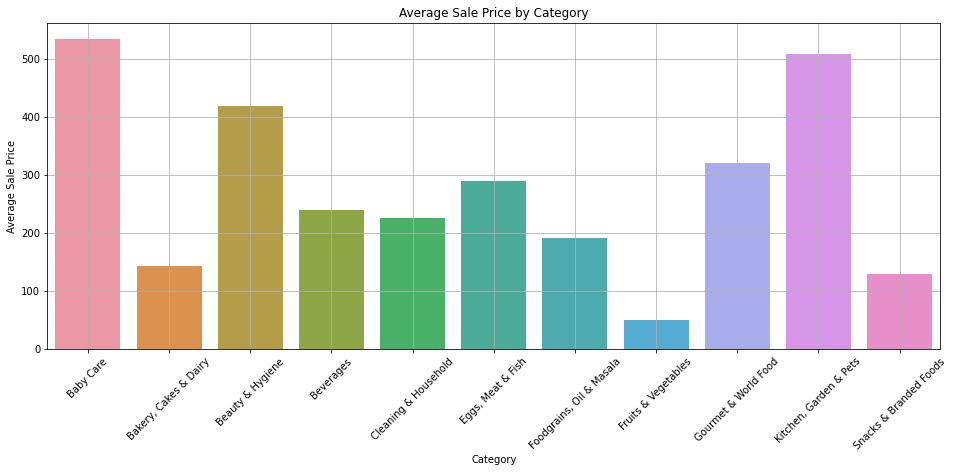

In [48]:
# Group by category and calculate the mean sale price
mean_sale_price_by_category = df.groupby('category')['sale_price'].mean().reset_index()

# Create a bar plot
plt.figure(figsize=(16, 6))
sns.barplot(x='category', y='sale_price', data=mean_sale_price_by_category)
plt.title('Average Sale Price by Category')
plt.xlabel('Category')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

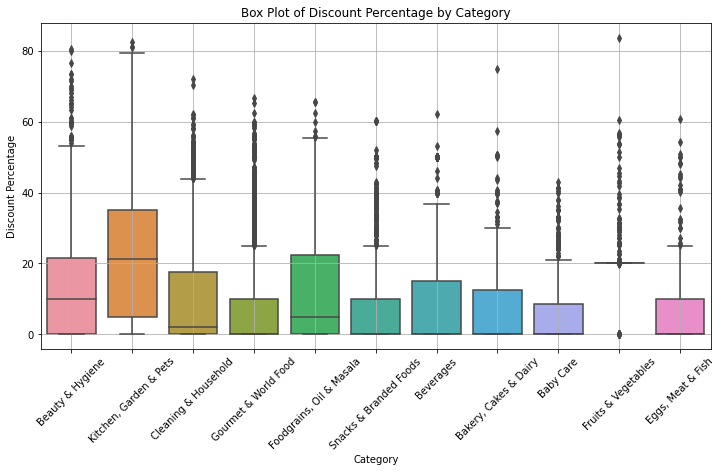

In [49]:
# Create a box plot
plt.figure(figsize=(12, 6))
sns.boxplot(x='category', y='discount_percentage', data=df)
plt.title('Box Plot of Discount Percentage by Category')
plt.xlabel('Category')
plt.ylabel('Discount Percentage')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

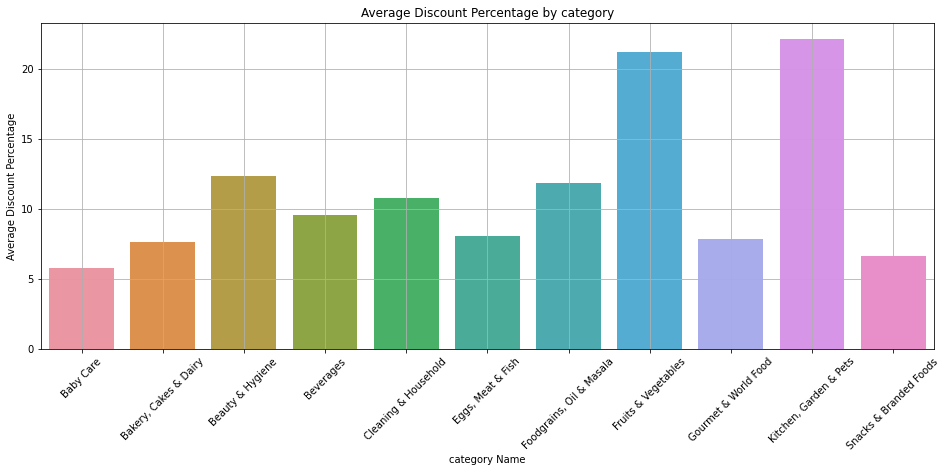

In [50]:
# Group by brand and calculate the mean discount percentage
mean_discount_by_brand = df.groupby('category')['discount_percentage'].mean().reset_index()

# Create a bar plot
plt.figure(figsize=(16, 6))
sns.barplot(x='category', y='discount_percentage', data=mean_discount_by_brand)
plt.title('Average Discount Percentage by category')
plt.xlabel('category Name')
plt.ylabel('Average Discount Percentage')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

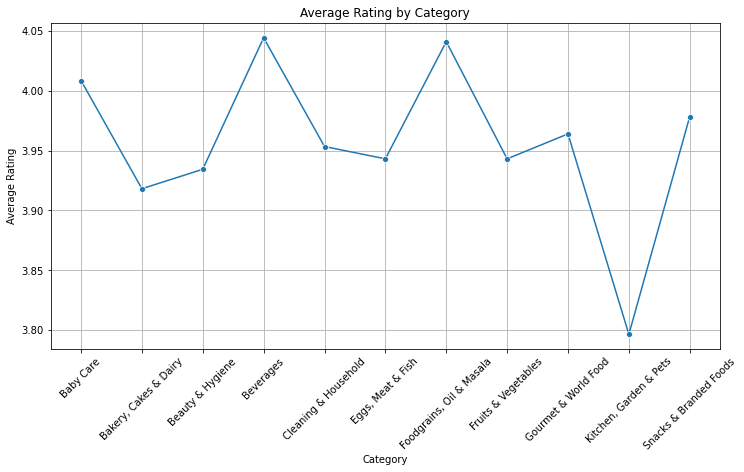

In [51]:
# Group by category and calculate the mean rating
mean_rating_by_category = df.groupby('category')['rating'].mean().reset_index()

# Create a line plot
plt.figure(figsize=(12, 6))
sns.lineplot(x='category', y='rating', data=mean_rating_by_category, marker='o')
plt.title('Average Rating by Category')
plt.xlabel('Category')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.grid(True)
plt.show()

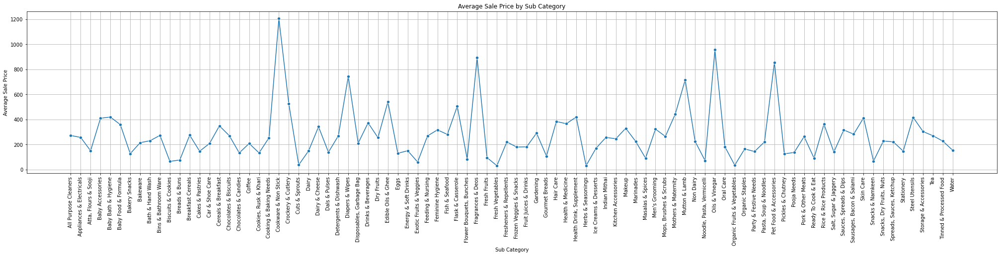

In [52]:
# Group by sub category and calculate the mean sale price
mean_sale_price_by_sub_category = df.groupby('sub_category')['sale_price'].mean().reset_index()

# Create a line plot
plt.figure(figsize=(35, 6))
sns.lineplot(x='sub_category', y='sale_price', data=mean_sale_price_by_sub_category, marker='o')
plt.title('Average Sale Price by Sub Category')
plt.xlabel('Sub Category')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=90)
plt.grid(True)
plt.show()

# Categorical-Categorical Relationships

Count Plot: Category by Sub Category
This plot helps you understand the distribution of categories within subcategories.

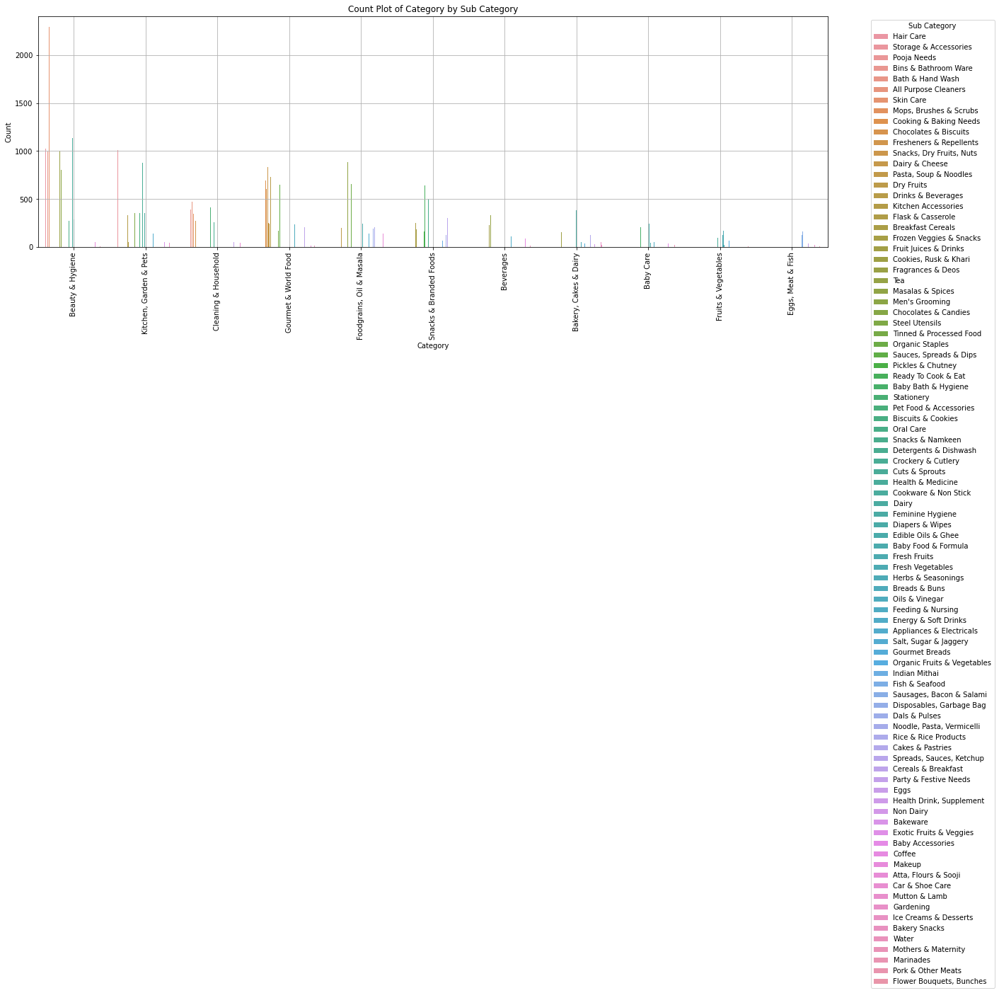

In [53]:
# Create a count plot
plt.figure(figsize=(20, 6))
sns.countplot(x='category', hue='sub_category', data=df)
plt.title('Count Plot of Category by Sub Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.legend(title='Sub Category', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# Multivariate analysis

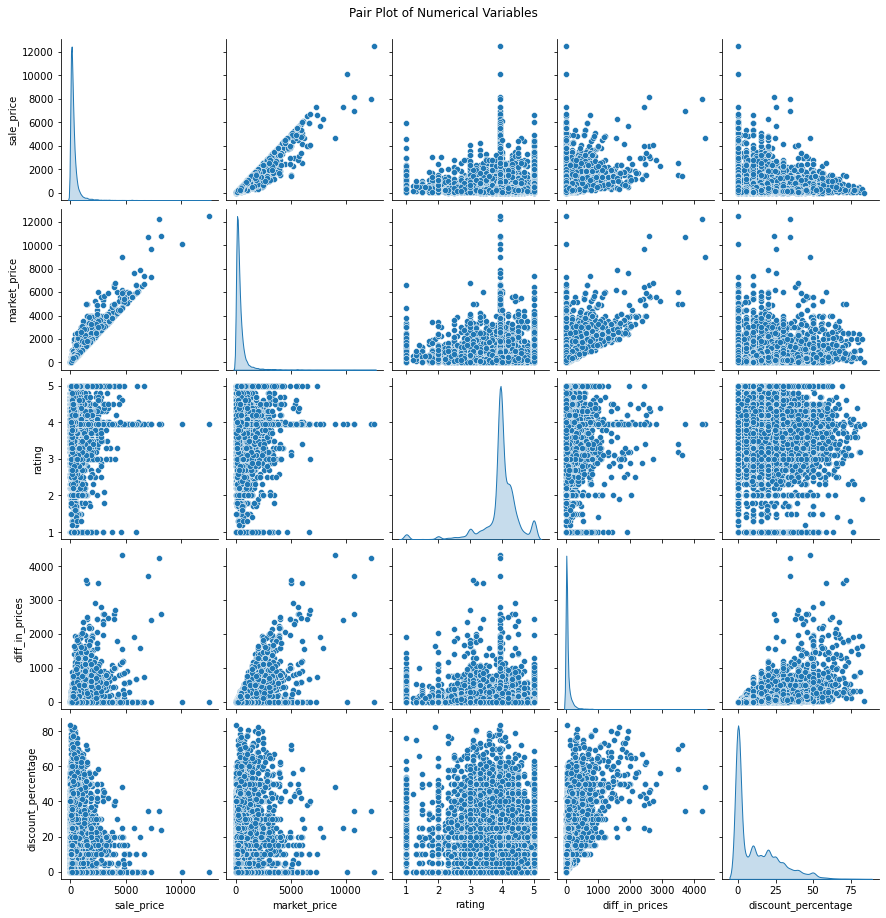

In [54]:
# Select numerical columns
numerical_columns = ['sale_price', 'market_price', 'rating', 'diff_in_prices', 'discount_percentage']

# Create a pair plot
sns.pairplot(df[numerical_columns], diag_kind='kde', markers='o')
plt.suptitle('Pair Plot of Numerical Variables', y=1.02)
plt.show()

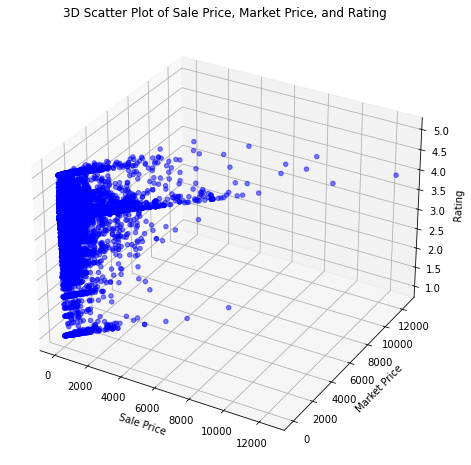

In [55]:
# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

x = df['sale_price']
y = df['market_price']
z = df['rating']

ax.scatter(x, y, z, c='blue', marker='o', alpha=0.5)

ax.set_xlabel('Sale Price')
ax.set_ylabel('Market Price')
ax.set_zlabel('Rating')
ax.set_title('3D Scatter Plot of Sale Price, Market Price, and Rating')

plt.show()

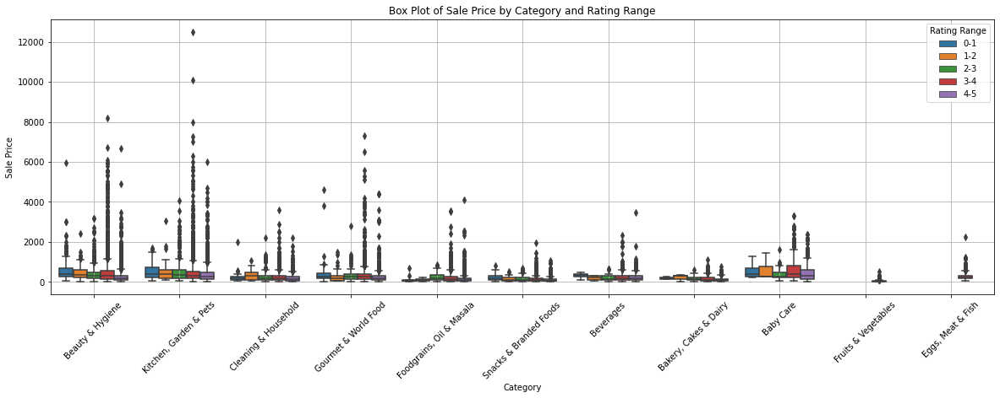

In [56]:
# Create rating ranges
df['rating_range'] = pd.cut(df['rating'], bins=[0, 1, 2, 3, 4, 5], labels=['0-1', '1-2', '2-3', '3-4', '4-5'])

# Create a box plot
plt.figure(figsize=(20, 6))
sns.boxplot(x='category', y='sale_price', hue='rating_range', data=df)
plt.title('Box Plot of Sale Price by Category and Rating Range')
plt.xlabel('Category')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.legend(title='Rating Range')
plt.grid(True)
plt.show()

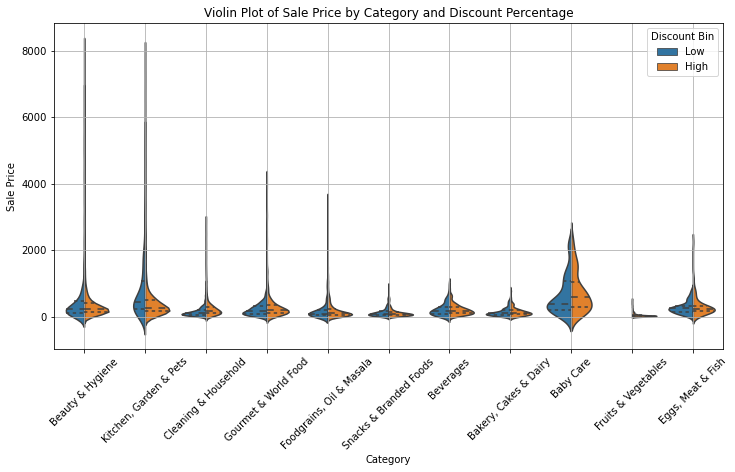

In [57]:

# Discretize the discount_percentage into two bins
df['discount_bin'] = pd.cut(df['discount_percentage'], bins=[0, 10, 100], labels=['Low', 'High'])

# Create a violin plot
plt.figure(figsize=(12, 6))
sns.violinplot(x='category', y='sale_price', hue='discount_bin', data=df, inner='quartile', split=True)
plt.title('Violin Plot of Sale Price by Category and Discount Percentage')
plt.xlabel('Category')
plt.ylabel('Sale Price')
plt.xticks(rotation=45)
plt.legend(title='Discount Bin')
plt.grid(True)
plt.show()

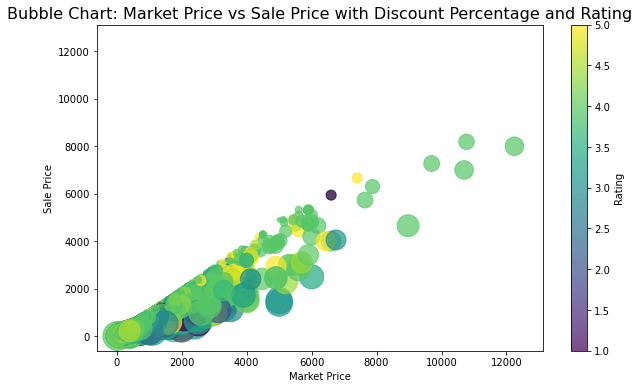

In [58]:
plt.figure(figsize=(10, 6))
plt.scatter(df['market_price'], df['sale_price'], 
            s=df['discount_percentage']*10, c=df['rating'], cmap='viridis', alpha=0.7)
plt.colorbar(label="Rating")
plt.title("Bubble Chart: Market Price vs Sale Price with Discount Percentage and Rating", fontsize=16)
plt.xlabel("Market Price")
plt.ylabel("Sale Price")
plt.show()


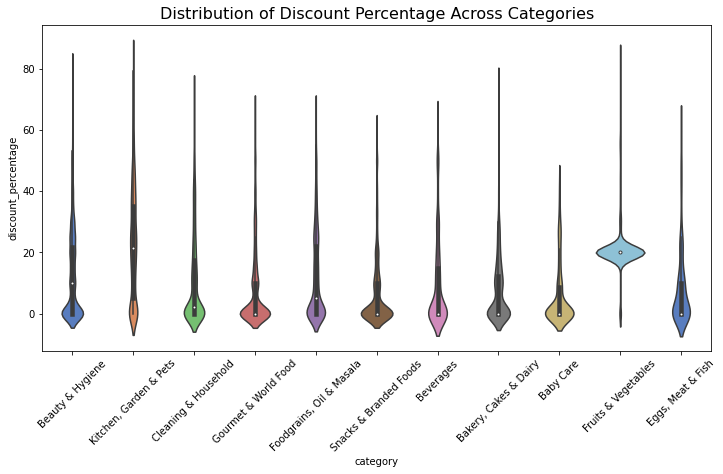

In [59]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='category', y='discount_percentage', palette='muted')
plt.xticks(rotation=45)
plt.title("Distribution of Discount Percentage Across Categories", fontsize=16)
plt.show()


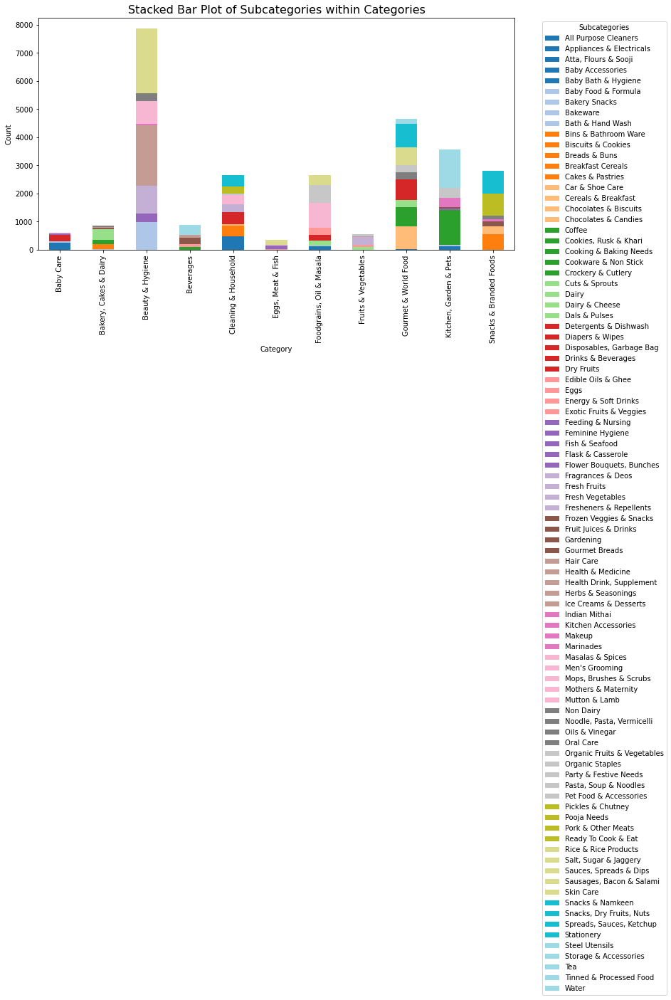

In [60]:
# Create a pivot table for stacked bar chart
stacked_data = df.groupby(['category', 'sub_category']).size().unstack()

# Plot the stacked bar chart
stacked_data.plot(kind='bar', stacked=True, figsize=(12, 6), colormap='tab20')
plt.title("Stacked Bar Plot of Subcategories within Categories", fontsize=16)
plt.xlabel("Category")
plt.ylabel("Count")
plt.legend(title="Subcategories", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


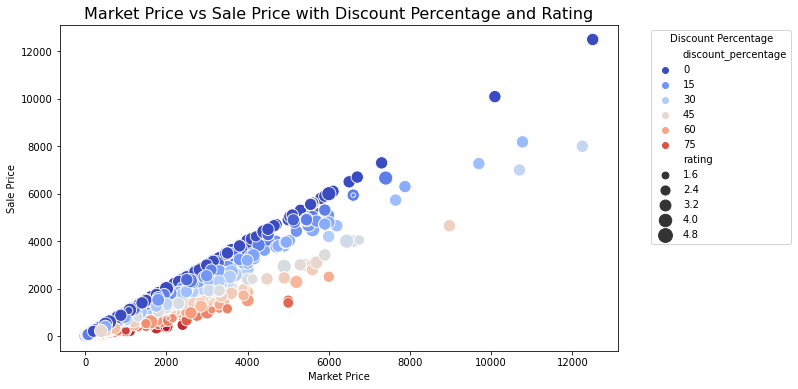

In [61]:
# Scatter plot with 'discount_percentage' as hue
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='market_price', y='sale_price', hue='discount_percentage', palette='coolwarm', size='rating', sizes=(20, 200))
plt.title("Market Price vs Sale Price with Discount Percentage and Rating", fontsize=16)
plt.xlabel("Market Price")
plt.ylabel("Sale Price")
plt.legend(title="Discount Percentage", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


# EXTENDED ADVANCED EDA VISUALISATIONS

In [62]:
sns.set(style="whitegrid")

In [63]:
# Scaling the data for PCA and t-SNE
scaler = StandardScaler()
scaled_features = scaler.fit_transform(df.select_dtypes(include=[np.number]))

In [64]:
# PCA Analysis
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_features)
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])
pca_df['category'] = df['category']

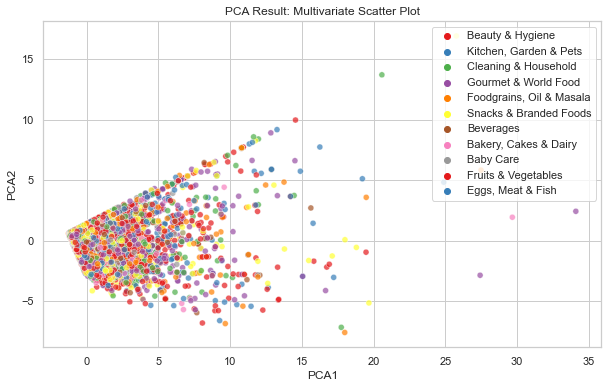

In [65]:
#Multivariate Scatter Plot with PCA
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue='category', data=pca_df, palette='Set1', alpha=0.7)
plt.title('PCA Result: Multivariate Scatter Plot')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend()
plt.show()

In [66]:
# Explicitly set init and learning_rate to avoid FutureWarnings
tsne = TSNE(n_components=2, perplexity=30, random_state=42, init='random', learning_rate=200.0)
tsne_result = tsne.fit_transform(scaled_features)

tsne_df = pd.DataFrame(data=tsne_result, columns=['TSNE1', 'TSNE2'])
tsne_df['category'] = df['category']

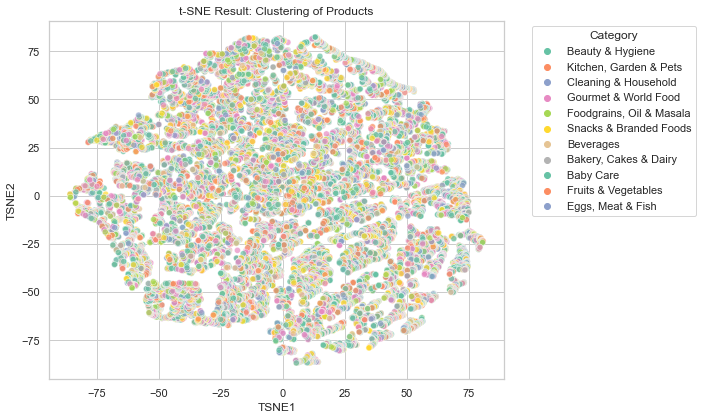

In [67]:
# Plotting t-SNE Results
plt.figure(figsize=(10, 6))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='category', data=tsne_df, palette='Set2', alpha=0.7)
plt.title('t-SNE Result: Clustering of Products')
plt.xlabel('TSNE1')
plt.ylabel('TSNE2')
# To Move the legend to the right side
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title="Category")
plt.tight_layout()
plt.show()


In [68]:
import plotly.express as px 

In [69]:
# Assuming df still contains the rating column and hasn't lost alignment
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])

# Include the 'category' and 'rating' columns from the original DataFrame
# First, ensure df and pca_df have matching indices
df_filtered = df[df['rating'].notnull()]  # Filter rows where rating is not null

# Reset index to maintain alignment
df_filtered.reset_index(drop=True, inplace=True)

# Create pca_df with relevant columns
pca_df['category'] = df_filtered['category']
pca_df['rating'] = df_filtered['rating']  # Add rating to pca_df

# 3D Scatter Plot using Plotly
fig = px.scatter_3d(pca_df, x='PCA1', y='PCA2', z='rating', color='category',
                    title='3D Scatter Plot of PCA Results',
                    labels={'PCA1': 'PCA1', 'PCA2': 'PCA2', 'rating': 'Rating'},
                    hover_name='category')
fig.show()


In [70]:
optimal_clusters = 4
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
df['Cluster'] = kmeans.fit_predict(scaled_features)

In [71]:
print(pca_df.columns)


Index(['PCA1', 'PCA2', 'category', 'rating'], dtype='object')


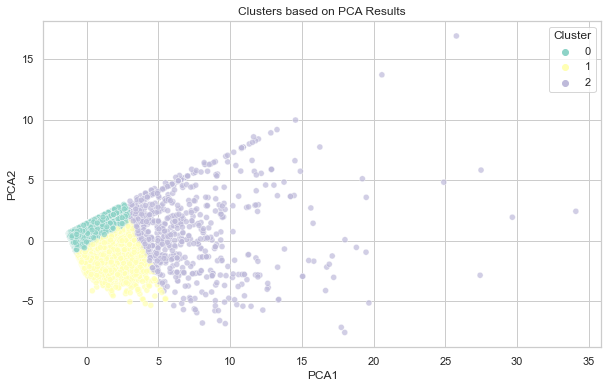

In [72]:
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(pca_df[['PCA1', 'PCA2']])

# Add the cluster labels to the pca_df DataFrame
pca_df['Cluster'] = clusters

# Plot the scatterplot with clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=pca_df, palette='Set3', alpha=0.7)
plt.title('Clusters based on PCA Results')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.legend(title='Cluster')
plt.show()


# Feature Engineering - feature selection and exploration

In [73]:
df.columns

Index(['index', 'product', 'category', 'sub_category', 'brand', 'sale_price',
       'market_price', 'type', 'rating', 'description', 'diff_in_prices',
       'discount_percentage', 'rating_range', 'discount_bin', 'Cluster'],
      dtype='object')

There are 15 features and those less related to price prediction will be dropped to refine our EDA and Modeling Focus:

## Feature: "Index"

In [74]:
df["index"].head()

0    1
1    2
2    3
3    4
4    5
Name: index, dtype: int64

index is nothing but numbering or indexing for each item. So It is unnecessary column for further analysis

## Feature: "Product"

In [75]:
df["product"].head()

0               Garlic Oil - Vegetarian Capsule 500 mg
1                                Water Bottle - Orange
2                       Brass Angle Deep - Plain, No.2
3    Cereal Flip Lid Container/Storage Jar - Assort...
4                   Creme Soft Soap - For Hands & Body
Name: product, dtype: object

product feature tell

## Feature: 'Category'

In [76]:
df["category"].head()

0          Beauty & Hygiene
1    Kitchen, Garden & Pets
2      Cleaning & Household
3      Cleaning & Household
4          Beauty & Hygiene
Name: category, dtype: object

The category feature typically represents the broad classification of a product.

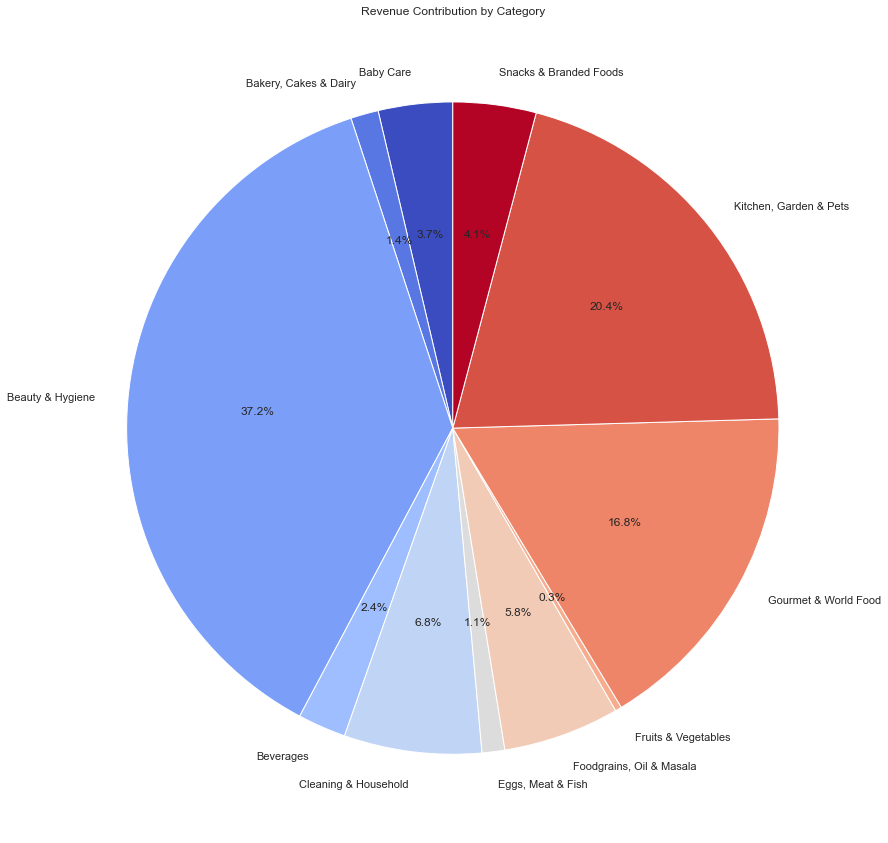

In [77]:
# Revenue contribution by category
revenue_by_category = df.groupby('category')['sale_price'].sum()

# Pie chart
plt.figure(figsize=(20, 15))
revenue_by_category.plot(kind='pie', autopct='%1.1f%%', startangle=90, colormap='coolwarm')
plt.title('Revenue Contribution by Category')
plt.ylabel('')  # Hide y-axis label
plt.show()


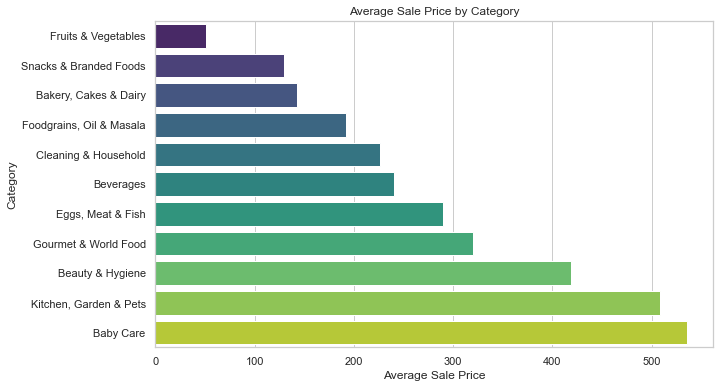

In [78]:
# Calculate average sale price by category
avg_sale_price = df.groupby('category')['sale_price'].mean().sort_values()

# Plot
plt.figure(figsize=(10, 6))
sns.barplot(x=avg_sale_price.values, y=avg_sale_price.index, palette='viridis')
plt.title('Average Sale Price by Category')
plt.xlabel('Average Sale Price')
plt.ylabel('Category')
plt.show()


## feature: 'Sub-category'

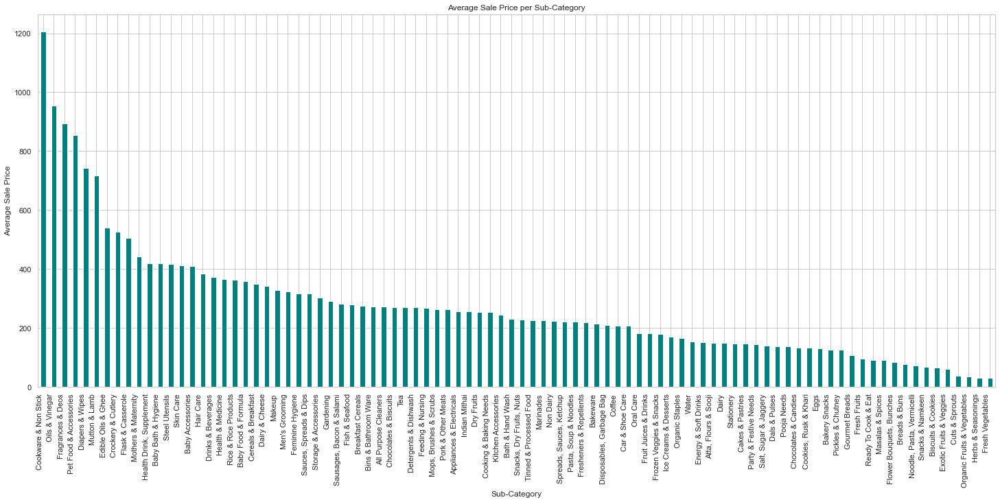

In [79]:
# Group by sub_category and calculate average sale_price
avg_price_sub_category = df.groupby('sub_category')['sale_price'].mean().sort_values(ascending=False)

# Plot bar chart
plt.figure(figsize=(25, 10))
avg_price_sub_category.plot(kind='bar', color='teal')
plt.title("Average Sale Price per Sub-Category")
plt.ylabel("Average Sale Price")
plt.xlabel("Sub-Category")
plt.xticks(rotation=90, ha='right')
plt.show()


## Feature: 'brand'

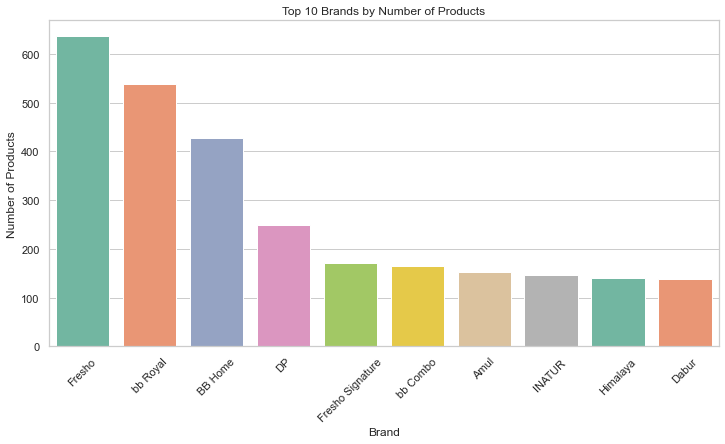

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by 'brand' and count the number of products for each brand
brand_counts = df['brand'].value_counts().head(10)

# Create a bar plot for the top 10 brands by product count
plt.figure(figsize=(12, 6))
sns.barplot(x=brand_counts.index, y=brand_counts.values, palette='Set2')
plt.title('Top 10 Brands by Number of Products')
plt.xlabel('Brand')
plt.ylabel('Number of Products')
plt.xticks(rotation=45)
plt.show()


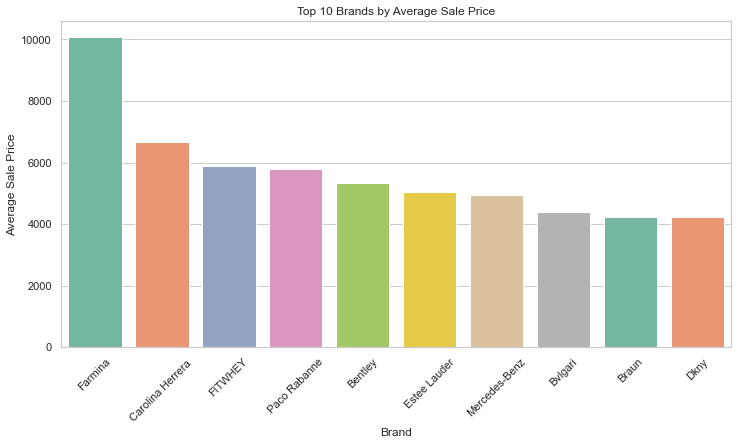

In [81]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by 'brand' and calculate the average sale price for each brand
avg_sale_price_by_brand = df.groupby('brand')['sale_price'].mean().sort_values(ascending=False).head(10)

# Create a bar plot for the top 10 brands by average sale price
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_sale_price_by_brand.index, y=avg_sale_price_by_brand.values, palette='Set2')
plt.title('Top 10 Brands by Average Sale Price')
plt.xlabel('Brand')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.show()


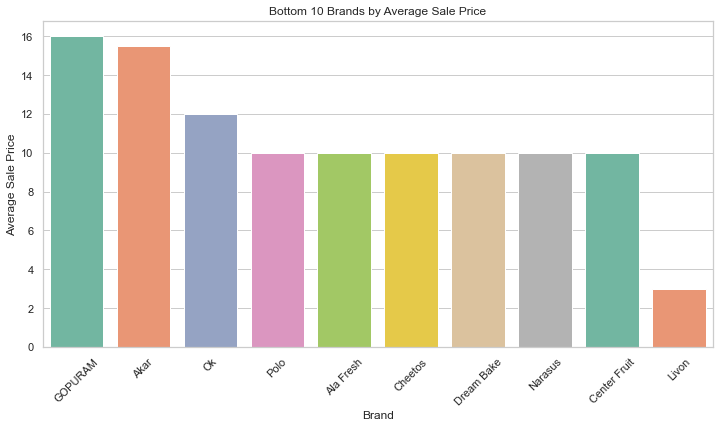

In [82]:
import matplotlib.pyplot as plt
import seaborn as sns

# Group by 'brand' and calculate the average sale price for each brand
avg_sale_price_by_brand = df.groupby('brand')['sale_price'].mean().sort_values(ascending=False).tail(10)

# Create a bar plot for the Bottom 10 brands by average sale price
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_sale_price_by_brand.index, y=avg_sale_price_by_brand.values, palette='Set2')
plt.title('Bottom 10 Brands by Average Sale Price')
plt.xlabel('Brand')
plt.ylabel('Average Sale Price')
plt.xticks(rotation=45)
plt.show()


# Feature: 'Sale Price'

The Sale_Price feature in this dataset represents the price at which a product is being sold.
It is a numerical feature and is likely measured in the currency relevant to the dataset (e.g., INR if it's an Indian dataset).

In [83]:
print(df['sale_price'].describe())


count    27439.000000
mean       322.701129
std        486.857214
min          2.450000
25%         95.000000
50%        190.000000
75%        359.000000
max      12500.000000
Name: sale_price, dtype: float64


Descriptive Statistics from above code

central tendency and spread of Sale_Price:

Mean: The average sale price of products.

Median: The midpoint value, less influenced by extreme values (outliers).

Min/Max: The range of sale prices.

Standard Deviation: How much the sale prices vary from the mean

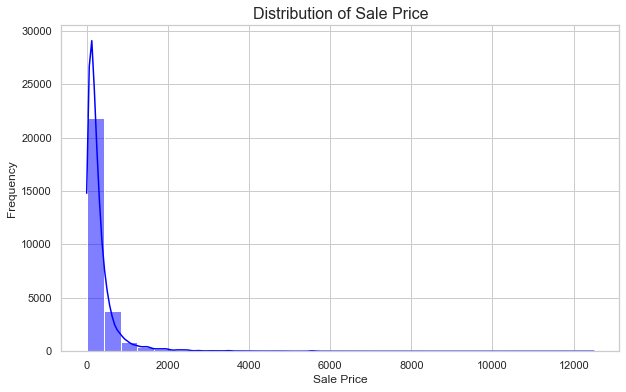

In [84]:
plt.figure(figsize=(10, 6))
sns.histplot(df['sale_price'], bins=30, kde=True, color='blue')
plt.title("Distribution of Sale Price", fontsize=16)
plt.xlabel("Sale Price")
plt.ylabel("Frequency")
plt.show()


 the distribution of Sale_Price is Normal from above figure which is bell shape 

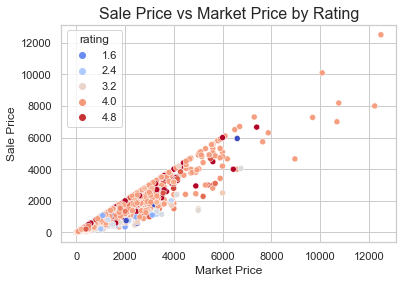

In [85]:
sns.scatterplot(data=df, x='market_price', y='sale_price', hue='rating', palette='coolwarm')
plt.title("Sale Price vs Market Price by Rating", fontsize=16)
plt.xlabel("Market Price")
plt.ylabel("Sale Price")
plt.show()


Products with higher Market Price tend to have higher Sale Price, as expected.

The clustering of points near the diagonal suggests that, for many products, the Sale Price is close to the Market Price. 

Below the diagonal: These points indicate products with discounts, where the Sale Price is less than the Market Price.

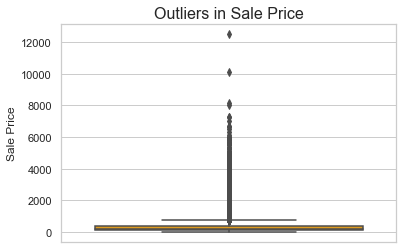

In [86]:
sns.boxplot(data=df, y='sale_price', color='orange')
plt.title("Outliers in Sale Price", fontsize=16)
plt.ylabel("Sale Price")
plt.show()


# Feature: 'Market Price'

The Market_Price feature in this dataset represents the original listed price of a product before any discounts or reductions.
It is a numerical feature that serves as a baseline to compare with the actual selling price (Sale_Price).

In [87]:
print(df['market_price'].describe())


count    27439.000000
mean       382.238589
std        581.866963
min          3.000000
25%        100.000000
50%        220.000000
75%        425.000000
max      12500.000000
Name: market_price, dtype: float64


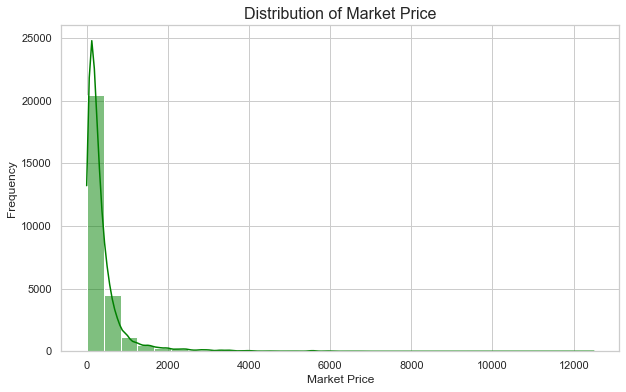

In [88]:
plt.figure(figsize=(10, 6))
sns.histplot(df['market_price'], bins=30, kde=True, color='green')
plt.title("Distribution of Market Price", fontsize=16)
plt.xlabel("Market Price")
plt.ylabel("Frequency")
plt.show()


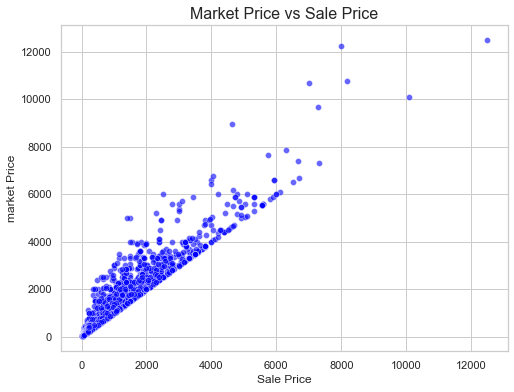

In [89]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df, y='market_price', x='sale_price', color='blue', alpha=0.6)
plt.title("Market Price vs Sale Price", fontsize=16)
plt.xlabel("Sale Price")
plt.ylabel("market Price")
plt.show()


# Feature: 'Type'

The Type feature in your dataset likely refers to the type or classification of the product, describing its nature, use case, or how it is categorized within the inventory.
It is a categorical variable, and its values could represent product characteristics such as:
"Fresh"
"Packaged"
"Frozen"
"Organic"
Or any other meaningful product classification.

In [91]:
print(df['type'].value_counts())

Face Care                1506
Ayurveda                  538
Men's Deodorants          500
Shampoo & Conditioner     461
Glassware                 415
                         ... 
Fresh & Frozen Pork         1
Roses                       1
Prawns & Shrimps            1
Specialty                   1
Turkey & Duck               1
Name: type, Length: 426, dtype: int64


In [93]:
# Top 10 product types by count
top_10_types = df['type'].value_counts().head(10)

# Display the result
print(top_10_types)


Face Care                 1506
Ayurveda                   538
Men's Deodorants           500
Shampoo & Conditioner      461
Glassware                  415
Containers Sets            415
Bathing Bars & Soaps       389
Blended Masalas            378
Body Care                  339
Gourmet Tea & Tea Bags     335
Name: type, dtype: int64


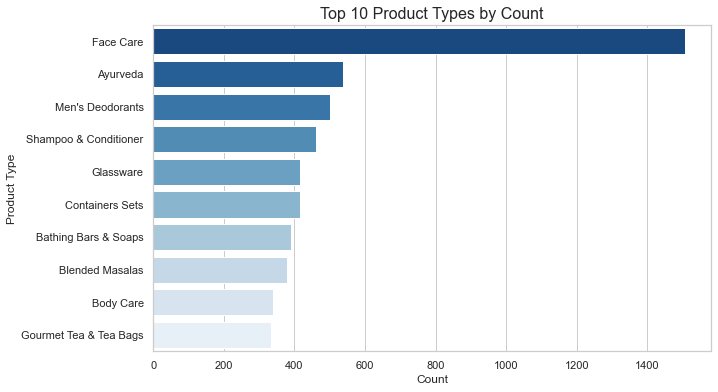

In [94]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot the top 10 product types
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_types.values, y=top_10_types.index, palette='Blues_r')
plt.title("Top 10 Product Types by Count", fontsize=16)
plt.xlabel("Count")
plt.ylabel("Product Type")
plt.show()


# MODEL CREATION

In [97]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error, r2_score


In [98]:
# Splitting the data into features (X) and target (y)
X = df[['market_price', 'category', 'sub_category', 'brand', 'type', 'rating', 'discount_percentage']]
y = df['sale_price']

# Splitting into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), ['market_price', 'rating', 'discount_percentage']),
        ('cat', OneHotEncoder(handle_unknown='ignore'), ['category', 'sub_category', 'brand', 'type'])
    ]
)


In [99]:

# Define the model
linear_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

# Train the model
linear_model.fit(X_train, y_train)

# Evaluate the model
y_pred_linear = linear_model.predict(X_test)
linear_r2 = r2_score(y_test, y_pred_linear)
linear_rmse = np.sqrt(mean_squared_error(y_test, y_pred_linear))

print("Linear Regression - R^2 Score:", linear_r2)
print("Linear Regression - RMSE:", linear_rmse)


Linear Regression - R^2 Score: 0.972913900482795
Linear Regression - RMSE: 80.46134025870236


In [100]:

# Define the model
rf_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))
])

# Train the model
rf_model.fit(X_train, y_train)

# Evaluate the model
y_pred_rf = rf_model.predict(X_test)
rf_r2 = r2_score(y_test, y_pred_rf)
rf_rmse = np.sqrt(mean_squared_error(y_test, y_pred_rf))

print("Random Forest - R^2 Score:", rf_r2)
print("Random Forest - RMSE:", rf_rmse)


Random Forest - R^2 Score: 0.9989521895306274
Random Forest - RMSE: 15.825425444815657


In [101]:
# Define the model
gb_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42))
])

# Train the model
gb_model.fit(X_train, y_train)

# Evaluate the model
y_pred_gb = gb_model.predict(X_test)
gb_r2 = r2_score(y_test, y_pred_gb)
gb_rmse = np.sqrt(mean_squared_error(y_test, y_pred_gb))

print("Gradient Boosting - R^2 Score:", gb_r2)
print("Gradient Boosting - RMSE:", gb_rmse)


Gradient Boosting - R^2 Score: 0.9986648003084868
Gradient Boosting - RMSE: 17.86434672194154


In [102]:
# Define the model
xgb_model = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('regressor', XGBRegressor(objective='reg:squarederror', n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42))
])

# Train the model
xgb_model.fit(X_train, y_train)

# Evaluate the model
y_pred_xgb = xgb_model.predict(X_test)
xgb_r2 = r2_score(y_test, y_pred_xgb)
xgb_rmse = np.sqrt(mean_squared_error(y_test, y_pred_xgb))

print("XGBoost - R^2 Score:", xgb_r2)
print("XGBoost - RMSE:", xgb_rmse)


XGBoost - R^2 Score: 0.9914005789708599
XGBoost - RMSE: 45.33656727913853


# MODEL EVALUATION

In [103]:
# Summarizing results
results = {
    "Model": ["Linear Regression", "Random Forest", "Gradient Boosting", "XGBoost"],
    "R^2 Score": [linear_r2, rf_r2, gb_r2, xgb_r2],
    "RMSE": [linear_rmse, rf_rmse, gb_rmse, xgb_rmse]
}

results_df = pd.DataFrame(results)
print(results_df)


               Model  R^2 Score       RMSE
0  Linear Regression   0.972914  80.461340
1      Random Forest   0.998952  15.825425
2  Gradient Boosting   0.998665  17.864347
3            XGBoost   0.991401  45.336567


# Model Performance Visualisations

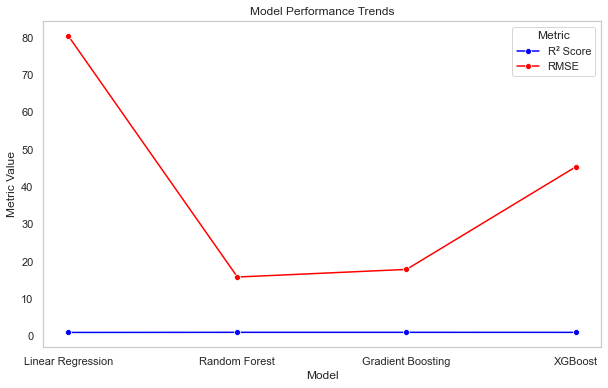

In [104]:
plt.figure(figsize=(10, 6))

# R² Scores
sns.lineplot(x="Model", y="R^2 Score", data=results_df, marker='o', label="R² Score", color='blue')

# RMSE
sns.lineplot(x="Model", y="RMSE", data=results_df, marker='o', label="RMSE", color='red')

plt.title("Model Performance Trends")
plt.ylabel("Metric Value")
plt.xlabel("Model")
plt.legend(title="Metric")
plt.grid()
plt.show()


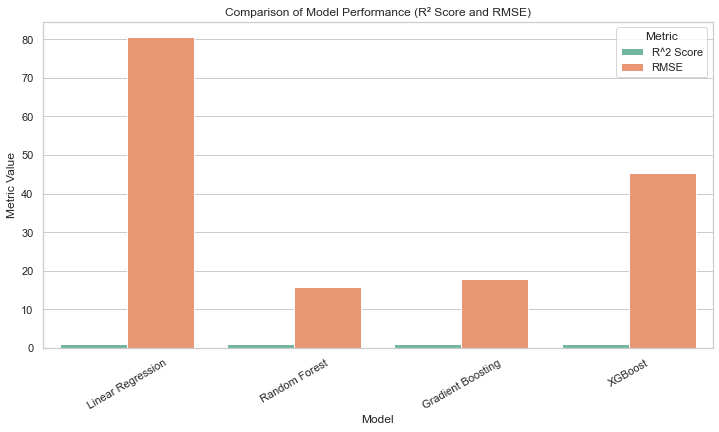

In [105]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for visualization
metrics = pd.melt(results_df, id_vars=["Model"], value_vars=["R^2 Score", "RMSE"], 
                  var_name="Metric", value_name="Value")

# Bar Plot
plt.figure(figsize=(12, 6))
sns.barplot(x="Model", y="Value", hue="Metric", data=metrics, palette="Set2")
plt.title("Comparison of Model Performance (R² Score and RMSE)")
plt.ylabel("Metric Value")
plt.xlabel("Model")
plt.xticks(rotation=30)
plt.legend(title="Metric")
plt.show()


# Visualisation of Linear Regression

C:\Users\Pavan\AppData\Local\Temp\ipykernel_1564\3758398651.py:3: UserWarning:

color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.



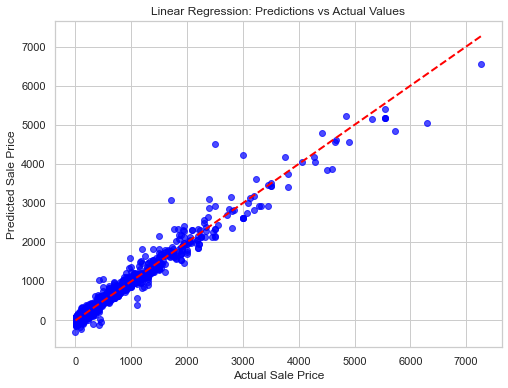

In [106]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_linear, alpha=0.7, color='blue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, color='red')
plt.title("Linear Regression: Predictions vs Actual Values")
plt.xlabel("Actual Sale Price")
plt.ylabel("Predicted Sale Price")
plt.show()
